In [144]:
import numpy as np
import matplotlib.pyplot as plt
def truncated_svd(A, k):
  U, S, Vh = np.linalg.svd(A, full_matrices=False)
  return U[:, :k], S[:k], Vh[:k]

In [145]:
A = np.load("data.npy")

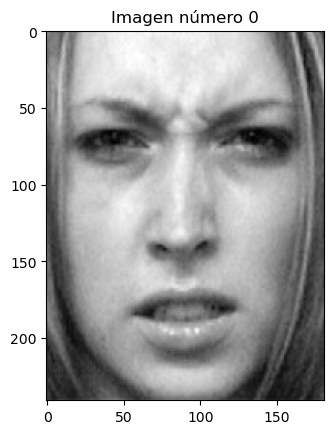

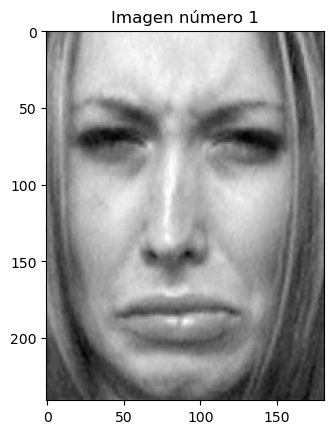

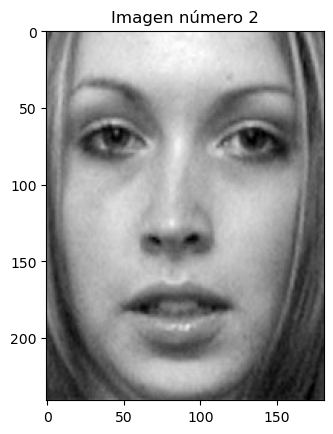

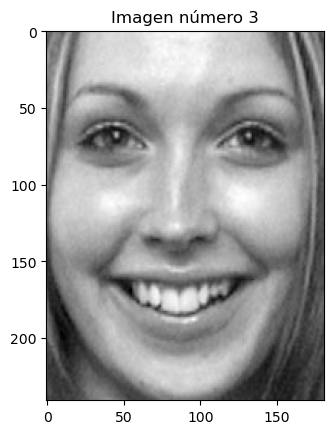

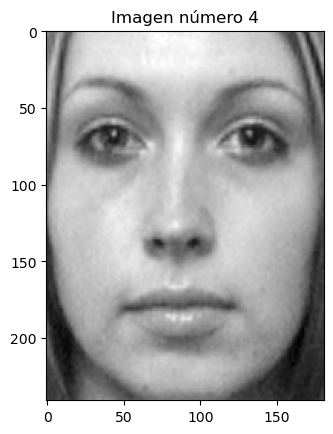

...

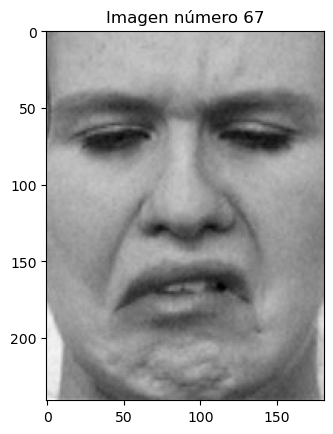

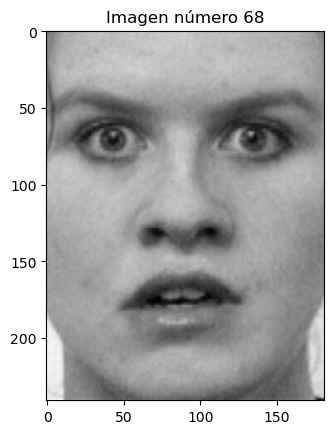

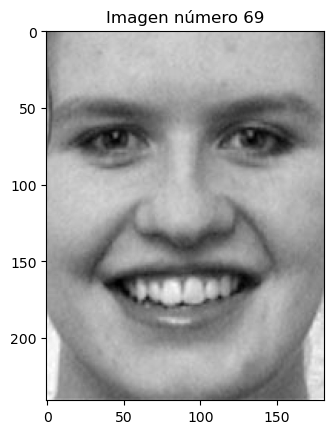

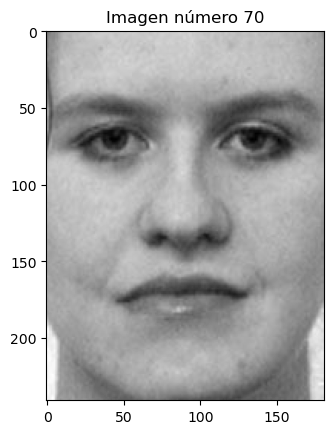

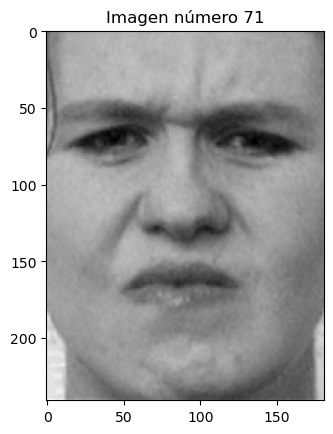

In [146]:
# Para mostrar todas las caras
for i in range (len(A)):
    plt.imshow(A[i].reshape(241, 181), cmap="gray")
    plt.title(f"Imagen número {i}")
    plt.show()

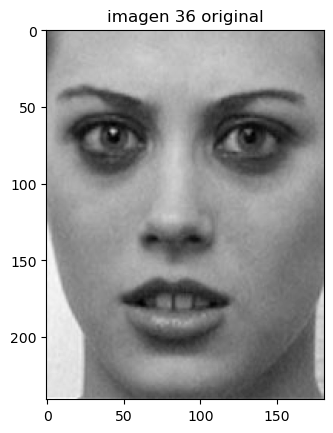

In [147]:


i = 36 # Cambiar si se quiere mostrar otra imagen
imagen_1 = A[i].reshape((241, 181))
plt.imshow(imagen_1, cmap="gray")
plt.title(f"imagen {i} original")
plt.show()



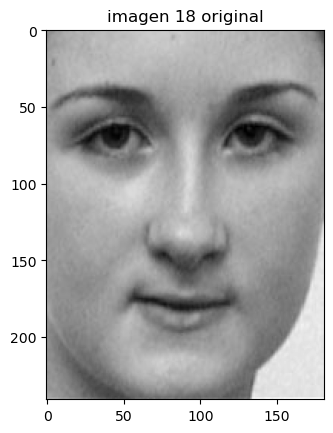

In [148]:
# Mostrar la i-esima imagen

i = 18 # Cambiar si se quiere mostrar otra imagen
imagen_2 = A[i].reshape((241, 181))
plt.imshow(imagen_2, cmap="gray")
plt.title(f"imagen {i} original")
plt.show()

In [149]:
len(imagen_1[0])

181

In [150]:
VALORES_K = [1,5,10,25,50,72]
aproximaciones = {}
aproximaciones["Nombre"] = "aproximaciones"
for i in VALORES_K:
  U_k, S_k, Vh_k = truncated_svd(A, i)
  aproximaciones[f"A_{i}"] = U_k @ np.diag(S_k) @ Vh_k


In [151]:
len(A[16])

43621

In [152]:
len(aproximaciones["A_1"][16])

43621

In [153]:
list(aproximaciones.keys())

['Nombre', 'A_1', 'A_5', 'A_10', 'A_25', 'A_50', 'A_72']

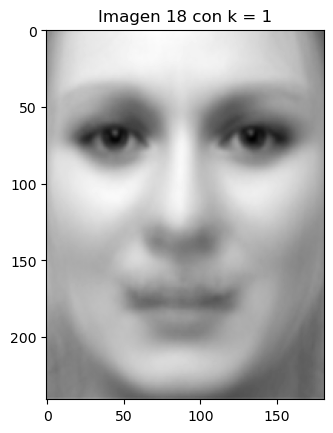

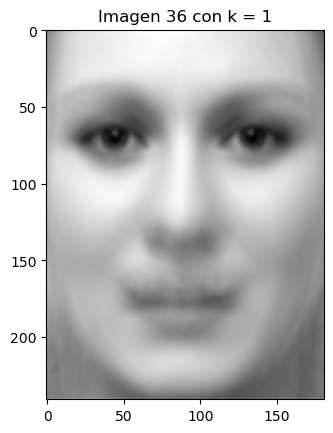

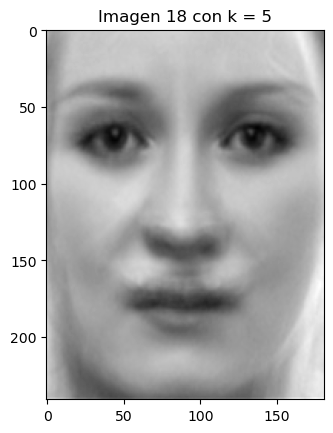

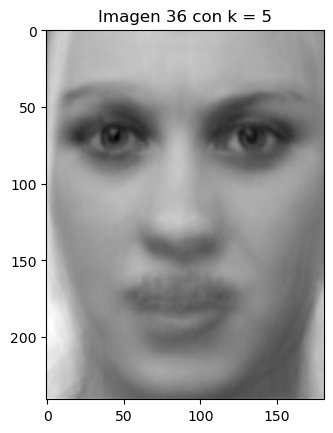

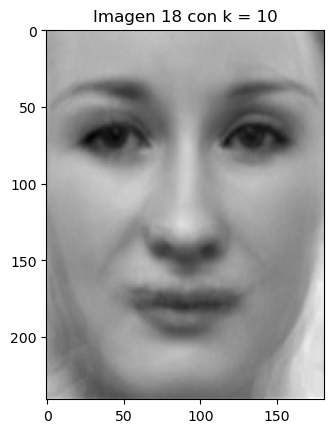

...

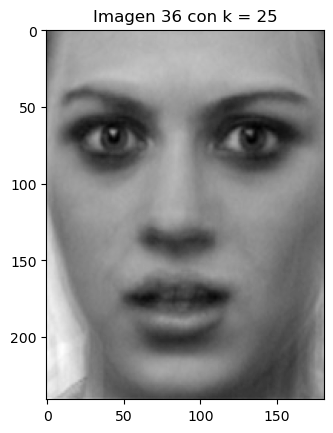

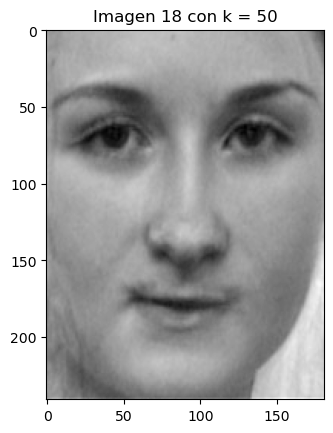

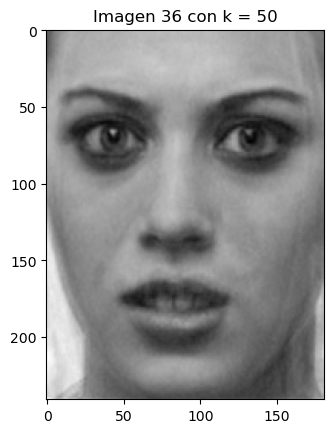

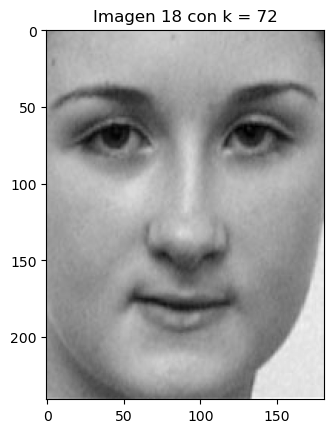

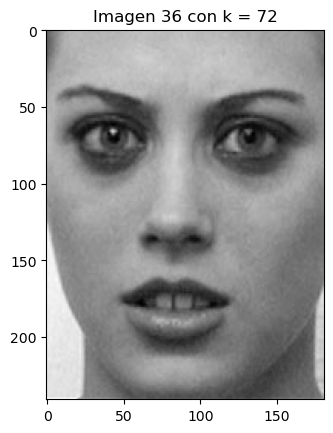

In [154]:
for i in list(aproximaciones.keys())[1::]:
  for j in [18, 36]:
    plt.imshow(aproximaciones[i][j].reshape(241, 181), cmap="gray")
    plt.title(f"Imagen {j} con k = {i.split('_')[1]}")
    plt.show()

#### Pregunta 1 sección 2

Proceso PCA 

In [155]:
cara_promedio = sum(A)/72

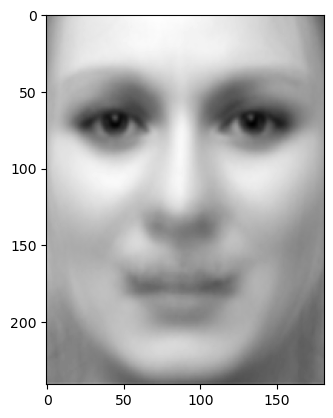

In [156]:
plt.imshow(cara_promedio.reshape(241, 181), cmap="gray")
plt.show()

In [157]:
# Vector con todas las caras centradas

A_centrada = [i-cara_promedio for i in A]

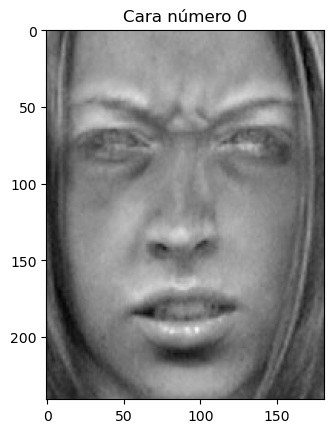

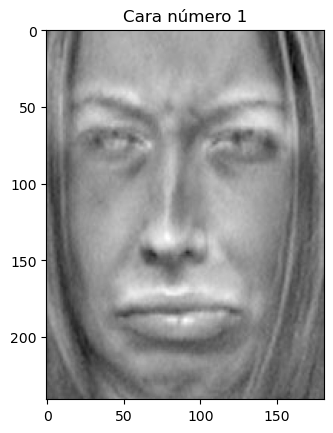

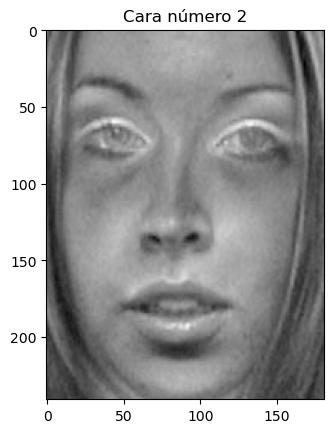

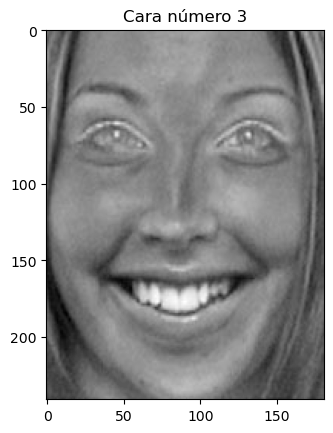

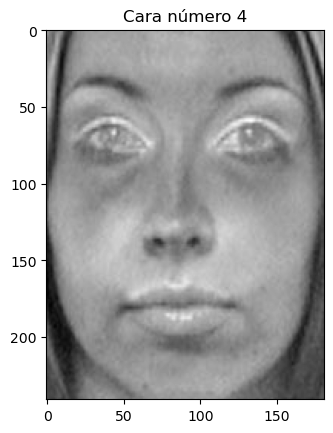

...

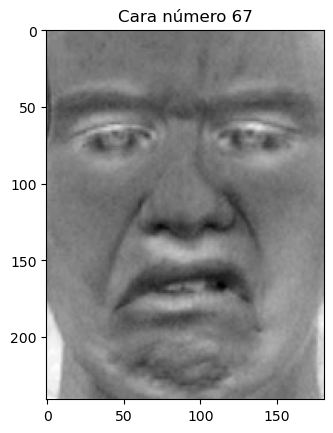

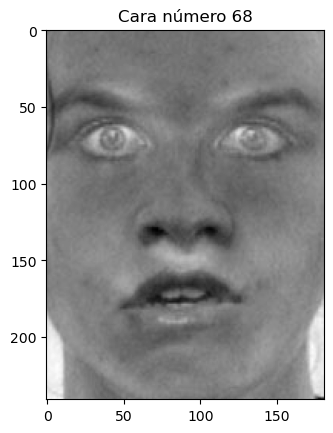

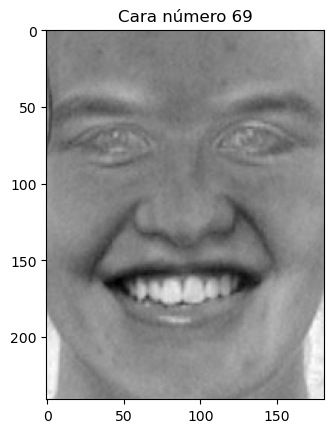

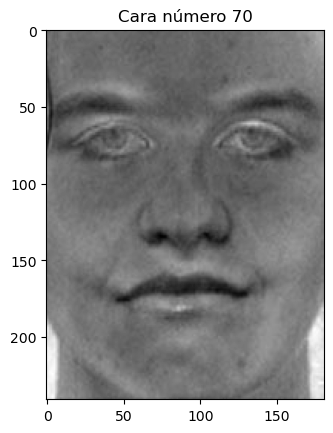

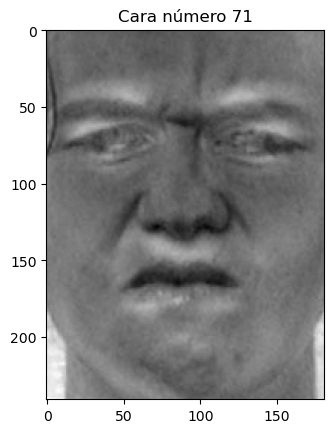

In [158]:
# Para mostrar todas las caras centradas

for i in range (len(A_centrada)):
    plt.imshow(A_centrada[i].reshape(241, 181), cmap="gray")
    plt.title(f"Cara número {i}")
    plt.show()

In [159]:
# Creando diccionario de caras centradas aproximadas

VALORES_K = [1,5,10,25,50,72]
aproximaciones_centradas = {}
aproximaciones_centradas["Nombre"] = "aproximaciones_centradas"
for i in VALORES_K:
  U_k, S_k, Vh_k = truncated_svd(A_centrada, i)
  aproximaciones_centradas[f"A_{i}"] = U_k @ np.diag(S_k) @ Vh_k

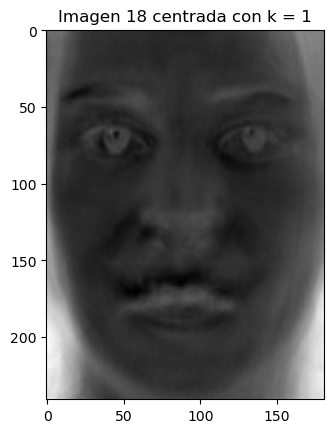

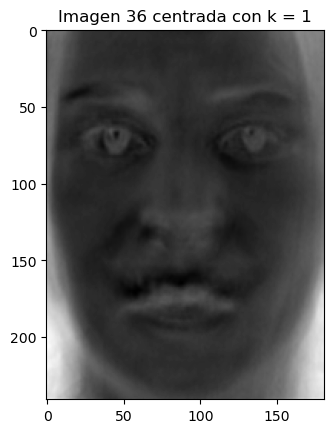

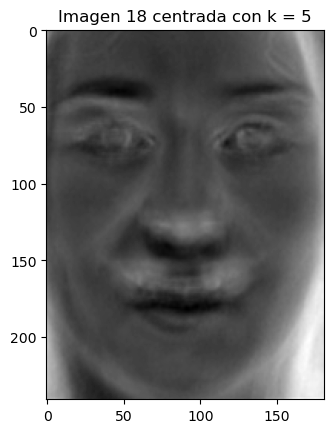

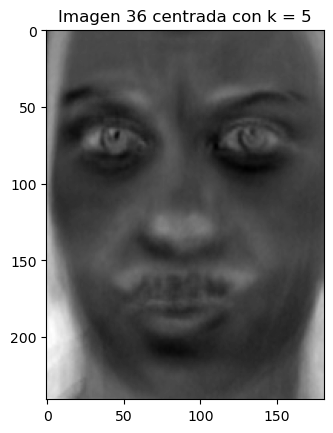

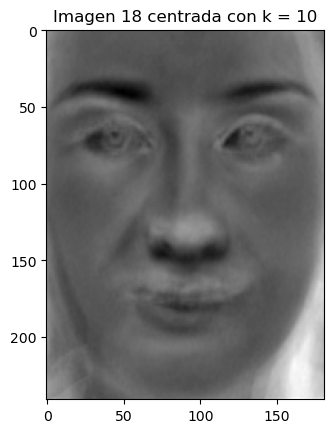

...

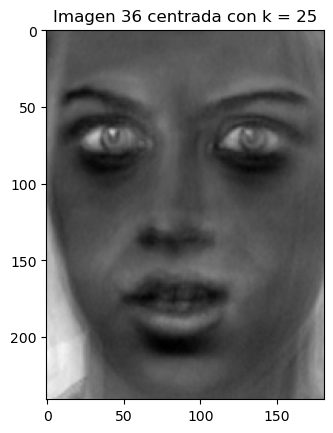

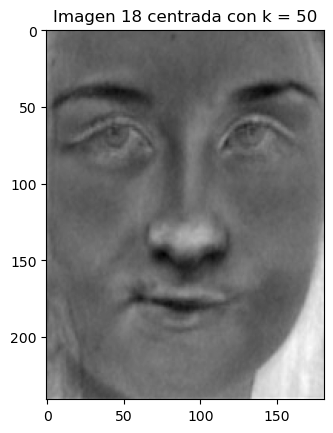

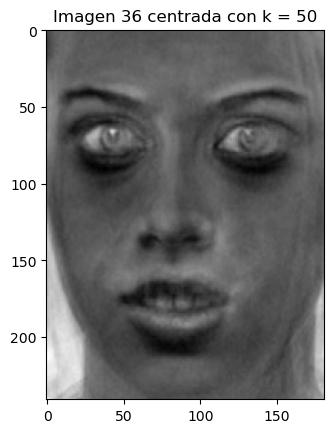

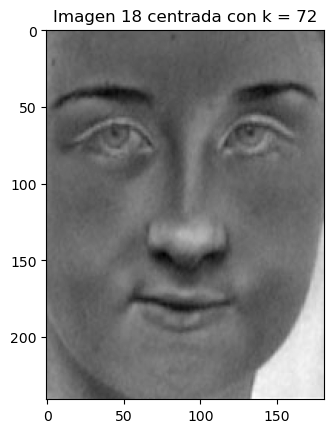

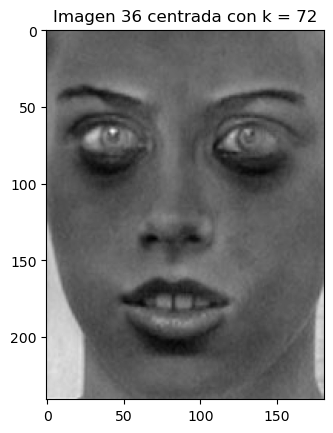

In [160]:
# Antes de descentrarlas para verlas nomas

for i in list(aproximaciones.keys())[1::]:
  for j in [18, 36]:
    plt.imshow(aproximaciones_centradas[i][j].reshape(241, 181), cmap="gray")
    plt.title(f"Imagen {j} centrada con k = {i.split('_')[1]}")
    plt.show()

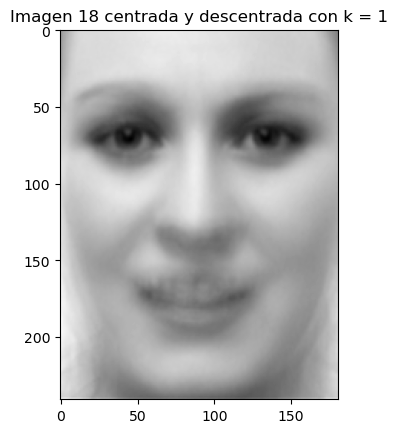

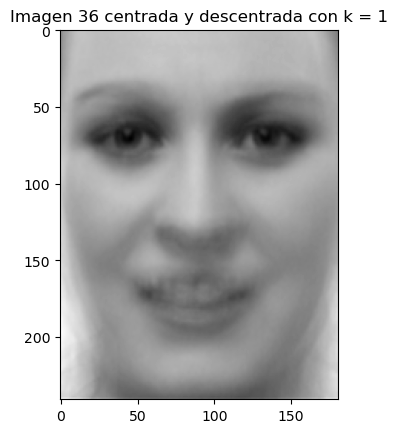

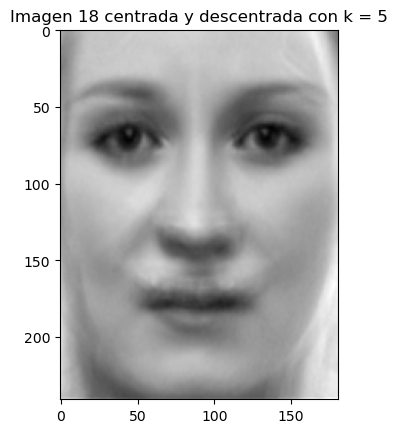

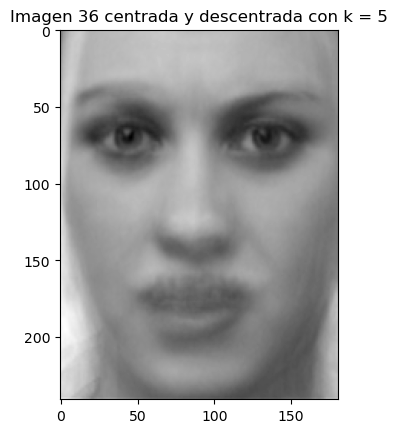

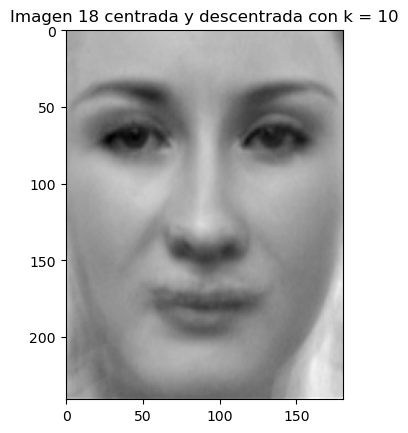

...

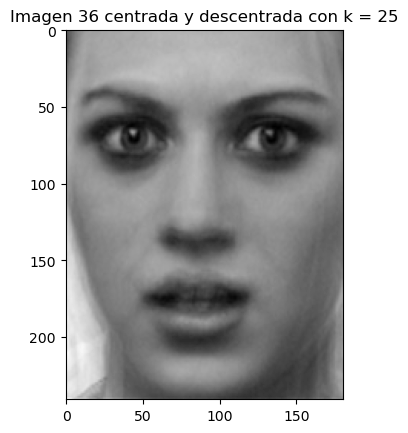

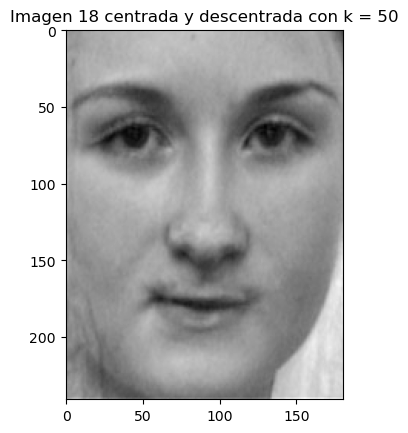

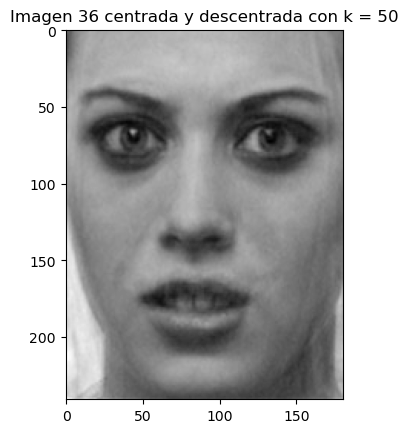

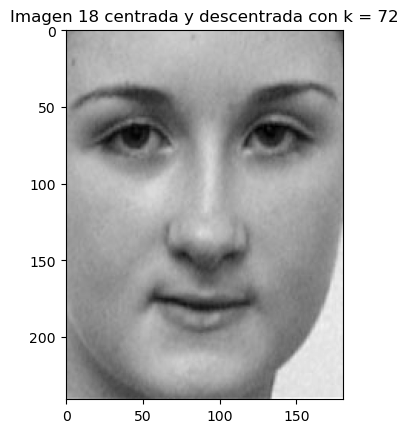

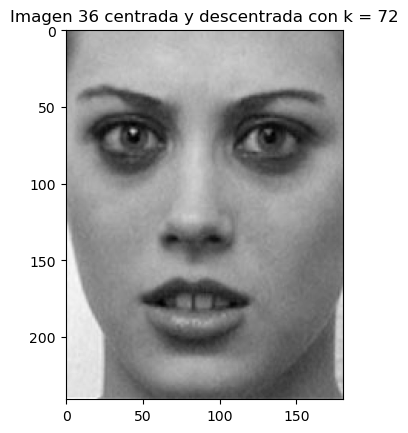

In [161]:
# Después de descentrarlas para verlas nomas

for i in list(aproximaciones.keys())[1::]:
  for j in [18, 36]:
    plt.imshow((aproximaciones_centradas[i][j]+cara_promedio).reshape(241, 181), cmap="gray")
    plt.title(f"Imagen {j} centrada y descentrada con k = {i.split('_')[1]}")
    plt.show()

In [162]:
# Creamos un diccionario con las imagenes descentradas después de aproximar las imagenes centradas

aproximaciones_centradas_y_descentradas = {}
aproximaciones_centradas_y_descentradas["Nombre"] = "aproximaciones_centradas_y_descentradas"
for i in list(aproximaciones_centradas.keys())[1::]:
    aproximaciones_centradas_y_descentradas[i] = aproximaciones_centradas[i] + cara_promedio


#### Pregunta 1 sección 3

In [163]:
# Para definir la función de error cuadratico

def EMC(A_k, A):
    return (np.linalg.norm(A_k-A, "fro")**2)/72

In [164]:
# Calculando los errores cuadraticos en cada aproximación entre la matriz A original y las dos matrices aproximadas importantes, la aproximada y la centrada_aproximada_descentradas
Los_errores = []
for i in VALORES_K:
    K = []
    error_sin_centrar = EMC(aproximaciones[f"A_{i}"], A)
    error_centrado = EMC(aproximaciones_centradas_y_descentradas[f"A_{i}"], A)
    print(f"Error cuadratico con k = {i} con imagenes sin centrar")
    print(error_sin_centrar)
    print(f"Error cuadratico con k = {i} con imagenes centradas")
    print(error_centrado)
    K.append(i)
    K.append("{:.3e}".format(error_sin_centrar))
    K.append("{:.3e}".format(error_centrado))
    Los_errores.append(K)

Error cuadratico con k = 1 con imagenes sin centrar
698.3388581197357
Error cuadratico con k = 1 con imagenes centradas
591.2486959929904
Error cuadratico con k = 5 con imagenes sin centrar
364.18198825247157
Error cuadratico con k = 5 con imagenes centradas
346.5950868819432
Error cuadratico con k = 10 con imagenes sin centrar
235.777430545867
Error cuadratico con k = 10 con imagenes centradas
230.06245544182127
Error cuadratico con k = 25 con imagenes sin centrar
94.59337281955985
Error cuadratico con k = 25 con imagenes centradas
91.56603142822208
Error cuadratico con k = 50 con imagenes sin centrar
23.94612695663058
Error cuadratico con k = 50 con imagenes centradas
22.634654213070437
Error cuadratico con k = 72 con imagenes sin centrar
1.1819484452193737e-25
Error cuadratico con k = 72 con imagenes centradas
5.392237951699835e-27


In [165]:
datos = [["Valores k", "Errores_centrados", "Errores_sin_centrar"], Los_errores[0], Los_errores[1], Los_errores[2], Los_errores[3], Los_errores[4], Los_errores[5]]

In [166]:
datos

[['Valores k', 'Errores_centrados', 'Errores_sin_centrar'],
 [1, '6.983e+02', '5.912e+02'],
 [5, '3.642e+02', '3.466e+02'],
 [10, '2.358e+02', '2.301e+02'],
 [25, '9.459e+01', '9.157e+01'],
 [50, '2.395e+01', '2.263e+01'],
 [72, '1.182e-25', '5.392e-27']]

In [167]:
# Datos de la tabla
headers = ["Valores k", "Errores_centrados", "Errores_sin_centrar"]


# Imprimir la tabla alineada
print(f"{headers[0]:<10} {headers[1]:<20} {headers[2]:<20}")
print("-" * 50)
for row in datos:
    print(f"{row[0]:<10} {row[1]:<20} {row[2]:<20}")

Valores k  Errores_centrados    Errores_sin_centrar 
--------------------------------------------------
Valores k  Errores_centrados    Errores_sin_centrar 
1          6.983e+02            5.912e+02           
5          3.642e+02            3.466e+02           
10         2.358e+02            2.301e+02           
25         9.459e+01            9.157e+01           
50         2.395e+01            2.263e+01           
72         1.182e-25            5.392e-27           


#### Pregunta 1 seccion 4

vamos a hacer el SVD rango 2

In [168]:
SVD_2 = truncated_svd(A, 2)
recontruida = (SVD_2[0]@SVD_2[1]@SVD_2[2])
for i in recontruida:
    print(i)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2 is different from 72)